# 02 — UMAP & Clustering

Builds the neighbor graph, computes UMAP, runs Leiden clustering, and visualizes cell types for both datasets independently.

| Dataset | Cells (post-QC) | Genes | PCs for UMAP |
|---------|-----------------|-------|--------------|
| Bhaduri et al. 2020 | ~241,777 | 16,774 | 30 |
| Zhong et al. 2018 | ~2,330 | 20,128 | 20 |

**Prerequisites:** `colab_01_preprocessing.ipynb` must have been run. Both preprocessed h5ad files must be on Drive.

## 1. Setup

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install -q scanpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 82.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.6/176.6 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.1/60.1 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.7/295.7 kB 18.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 114.4 MB/s eta 0:00:00


In [3]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

sc.settings.verbosity = 1
sc.settings.set_figure_params(dpi=100, facecolor='white')

DRIVE_ROOT = '/content/drive/MyDrive/brain-organoid-trajectories'

PATHS = {
    'bhaduri_processed': os.path.join(DRIVE_ROOT, 'data/processed/bhaduri_2020/bhaduri_2020_preprocessed.h5ad'),
    'zhong_processed':   os.path.join(DRIVE_ROOT, 'data/processed/zhong_2018/zhong_2018_preprocessed.h5ad'),
    'bhaduri_clustered': os.path.join(DRIVE_ROOT, 'data/processed/bhaduri_2020/bhaduri_2020_clustered.h5ad'),
    'zhong_clustered':   os.path.join(DRIVE_ROOT, 'data/processed/zhong_2018/zhong_2018_clustered.h5ad'),
}

print('Paths configured.')
for k, v in PATHS.items():
    print(f'  {k}: {v}')

Paths configured.
  bhaduri_processed: /content/drive/MyDrive/brain-organoid-trajectories/data/processed/bhaduri_2020/bhaduri_2020_preprocessed.h5ad
  zhong_processed: /content/drive/MyDrive/brain-organoid-trajectories/data/processed/zhong_2018/zhong_2018_preprocessed.h5ad
  bhaduri_clustered: /content/drive/MyDrive/brain-organoid-trajectories/data/processed/bhaduri_2020/bhaduri_2020_clustered.h5ad
  zhong_clustered: /content/drive/MyDrive/brain-organoid-trajectories/data/processed/zhong_2018/zhong_2018_clustered.h5ad


/tmp/ipykernel_74039/752443359.py:8: FutureWarning: Use `scanpy.set_figure_params` instead
  sc.settings.set_figure_params(dpi=100, facecolor='white')


## 2. Load Preprocessed Data

In [4]:
adata_organoid = sc.read_h5ad(PATHS['bhaduri_processed'])
adata_fetal    = sc.read_h5ad(PATHS['zhong_processed'])

print(f'Bhaduri 2020: {adata_organoid.shape[0]:,} cells x {adata_organoid.shape[1]:,} genes')
print(f'Zhong 2018:   {adata_fetal.shape[0]:,} cells x {adata_fetal.shape[1]:,} genes')
print()
print('Bhaduri obs columns:', list(adata_organoid.obs.columns))
print('Zhong obs columns:  ', list(adata_fetal.obs.columns))

Bhaduri 2020: 241,776 cells x 16,774 genes
Zhong 2018:   2,330 cells x 20,128 genes

Bhaduri obs columns: ['n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes']
Zhong obs columns:   ['n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes']


## 2b. Free RAM — Replace Dense X with Sparse Raw Counts                                                                                                                                               2                                                                                                                                                                                                
The preprocessed h5ad stores a **dense scaled X matrix** (~16 GB for Bhaduri) because `sc.pp.scale()` in colab_01 destroys sparsity. We don't need X f                                                                                                                              or the neighbor graph, UMAP, or Leiden — those only use `adata.obsm['X_pca'                                                                                                                              ]`. Replacing X with the sparse raw counts from `adata.raw` frees ~25 GB of                                                                                                                               RAM.

In [5]:
# Replace dense scaled X with sparse raw counts to free ~14 GB RAM
adata_organoid.X = adata_organoid.raw.X.copy()
import gc
gc.collect()

print('Dense X replaced with sparse raw counts.')
print(f'adata_organoid.X type: {type(adata_organoid.X)}')

Dense X replaced with sparse raw counts.
adata_organoid.X type: <class 'scipy.sparse._csr.csr_matrix'>


## 3. Bhaduri — Inspect Metadata

Before UMAP we check what metadata is available. Bhaduri's barcodes may encode sample or protocol information — if so, we can color the UMAP by it later to check for batch effects.

In [8]:
# Look at the first few barcodes — sample/protocol info is often embedded in them
print('First 10 barcodes:')
print(adata_organoid.obs_names[:10].tolist())
print()

# Try to extract sample ID from barcode (common pattern: BARCODE_SAMPLEID or SAMPLEID_BARCODE)
# Adjust the split character and index if needed after inspecting the barcodes above
try:
    adata_organoid.obs['sample'] = adata_organoid.obs_names.str.split('_', n=1).str[0]
    print(f'Extracted sample IDs: {adata_organoid.obs["sample"].nunique()} unique values')
    print(adata_organoid.obs['sample'].value_counts().head(20))
except Exception as e:
    print(f'Could not extract sample info: {e}')

First 10 barcodes:
['H1SWeek3_AAACCTGAGACAAAGG', 'H1SWeek3_AAACCTGAGCACACAG', 'H1SWeek3_AAACCTGAGGATGGAA', 'H1SWeek3_AAACCTGCAATTGCTG', 'H1SWeek3_AAACCTGCAGCGTAAG', 'H1SWeek3_AAACCTGCATTACGAC', 'H1SWeek3_AAACCTGGTCCCGACA', 'H1SWeek3_AAACCTGGTCCGACGT', 'H1SWeek3_AAACCTGGTGGCTCCA', 'H1SWeek3_AAACCTGGTGGTGTAG']

Extracted sample IDs: 37 unique values
sample
H1SWeek10        18724
H28126SWeek10    16061
YH10SWeek5       15057
H28126XWeek3     14232
H28126SWeek5     13789
H28126SWeek3     13076
Week5S           10607
Week10P          10315
H28126XWeek10     9326
H28126S2Week8     9198
H1SWeek8          6850
Week8P            6825
YH10PWeek5        6739
H1XWeek10         6537
YH10SWeek8        6181
Week10S           6167
H1XWeek3          6089
Week8S            5591
H28126PWeek5      5329
H1XWeek5          5162
Name: count, dtype: int64


## 4. Bhaduri — Neighbor Graph

Build a k-nearest-neighbor graph in the PCA space. UMAP and Leiden clustering both use this graph — it's the single most important parameter choice after the number of PCs.

- `n_pcs=30` — the number we chose from the elbow plot in colab_01
- `n_neighbors=30` — for a large, complex dataset (242k cells, 3 protocols), more neighbors give a smoother UMAP with better global structure. Default is 15.

**Note:** This will take a few minutes on 242k cells.

In [9]:
sc.pp.neighbors(adata_organoid, n_neighbors=30, n_pcs=30)
print('Bhaduri: neighbor graph built.')

Bhaduri: neighbor graph built.


## 5. Bhaduri — UMAP

UMAP projects the neighbor graph into 2D. Cells that are similar in gene expression land close together.

**Note:** On 242k cells this will take 5–15 minutes.

In [10]:
sc.tl.umap(adata_organoid)
print('Bhaduri: UMAP computed.')

Bhaduri: UMAP computed.


## 6. Bhaduri — Leiden Clustering

Leiden detects communities in the neighbor graph. `resolution` controls granularity:
- Lower (0.3) → fewer, broader clusters
- Higher (1.0+) → more, finer clusters

Bhaduri has 3 organoid protocols and many cell types — expect 15–30 clusters at resolution 0.5. We'll start there and adjust after inspecting the UMAP.

In [12]:
!pip install -q leidenalg

LEIDEN_RES_ORGANOID = 0.5  # adjust after looking at the UMAP

sc.tl.leiden(adata_organoid, resolution=LEIDEN_RES_ORGANOID)

n_clusters = adata_organoid.obs['leiden'].nunique()
print(f'Bhaduri: {n_clusters} clusters at resolution={LEIDEN_RES_ORGANOID}')
print(adata_organoid.obs['leiden'].value_counts().sort_index())

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 61.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 56.4 MB/s eta 0:00:00


/tmp/ipykernel_74039/3141837068.py:5: FutureWarning: The `igraph` implementation of leiden clustering is *orders of magnitude faster*. Set the flavor argument to (and install if needed) 'igraph' to use it.
In the future, the default backend for leiden will be igraph instead of leidenalg. To achieve the future defaults please pass: `flavor='igraph'` and `n_iterations=2`. `directed` must also be `False` to work with igraph’s implementation.
  sc.tl.leiden(adata_organoid, resolution=LEIDEN_RES_ORGANOID)


Bhaduri: 18 clusters at resolution=0.5
leiden
0     40810
1     36679
2     25973
3     22119
4     17651
5     16275
6     14487
7     13243
8     10272
9      8544
10     7180
11     6415
12     6234
13     4478
14     4394
15     4218
16     1707
17     1097
Name: count, dtype: int64


## 7. Bhaduri — Visualize UMAP

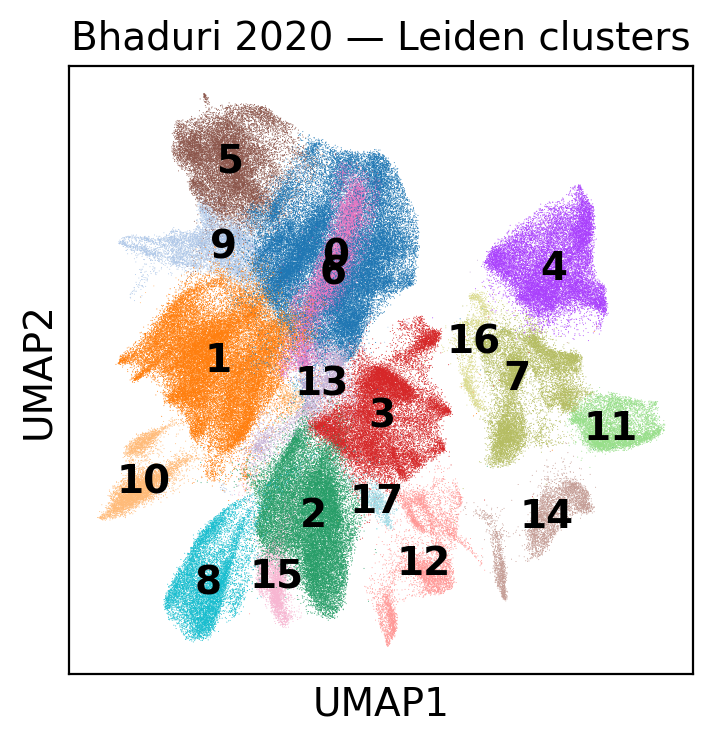

In [13]:
# Color by Leiden cluster
sc.pl.umap(adata_organoid, color='leiden', legend_loc='on data', title='Bhaduri 2020 — Leiden clusters')

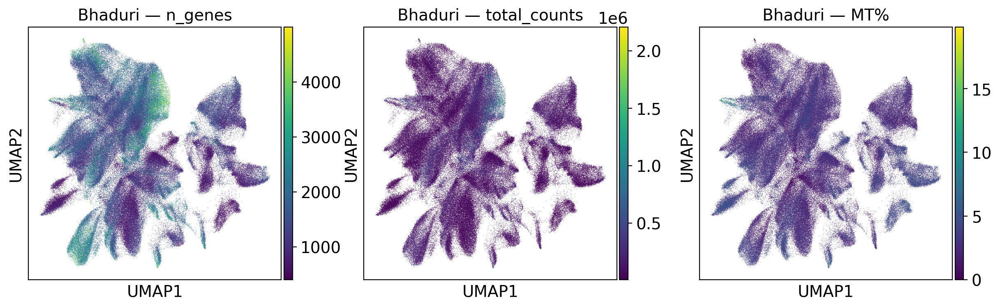

In [14]:
# Color by QC metrics — check if any cluster is driven by technical noise
# High MT% cluster = stress/dying cells; high n_genes cluster = remaining doublets
sc.pl.umap(
    adata_organoid,
    color=['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
    title=['Bhaduri — n_genes', 'Bhaduri — total_counts', 'Bhaduri — MT%']
)

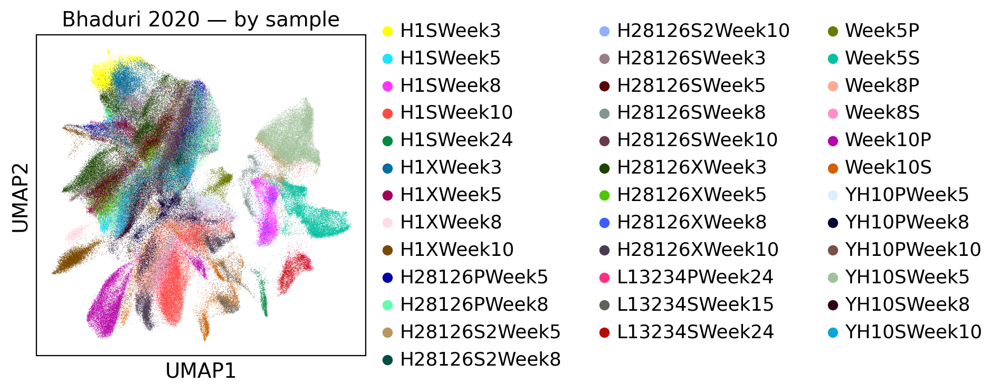

In [15]:
# Color by sample — check for batch effects (if sample info was extracted above)
# If all one sample, skip this
if 'sample' in adata_organoid.obs.columns and adata_organoid.obs['sample'].nunique() > 1:
    sc.pl.umap(adata_organoid, color='sample', title='Bhaduri 2020 — by sample')
else:
    print('No sample metadata available — skipping batch check.')

Available markers: ['SOX2', 'PAX6', 'EOMES', 'TBR1', 'NEUROD2', 'GAD1', 'GAD2', 'GFAP', 'MKI67']
Missing from dataset: []


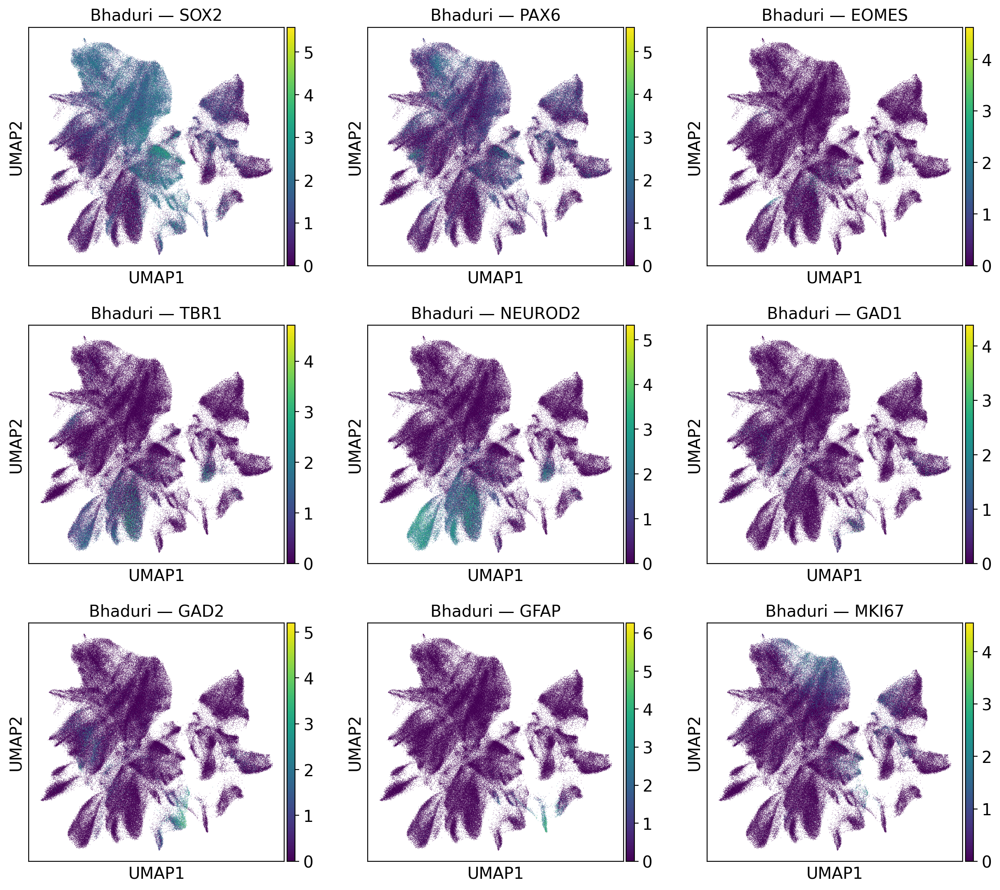

In [16]:
# Known brain cell type markers — where do they land on the UMAP?
# This gives a first pass at cell type identity before formal annotation
brain_markers = [
    'SOX2',    # radial glia / neural progenitors
    'PAX6',    # radial glia
    'EOMES',   # intermediate progenitors (TBR2)
    'TBR1',    # early excitatory neurons
    'NEUROD2', # excitatory neurons
    'GAD1',    # inhibitory neurons
    'GAD2',    # inhibitory neurons
    'GFAP',    # astrocytes
    'MKI67',   # cycling cells
]

# Only plot markers that are actually in the gene list
available = [g for g in brain_markers if g in adata_organoid.var_names]
missing   = [g for g in brain_markers if g not in adata_organoid.var_names]
print(f'Available markers: {available}')
print(f'Missing from dataset: {missing}')

if available:
    sc.pl.umap(adata_organoid, color=available, ncols=3, title=[f'Bhaduri — {g}' for g in available])

## 8. Bhaduri — Marker Genes

Find the most differentially expressed genes for each cluster compared to all others. This tells us what cell type each cluster likely is.

We use the Wilcoxon rank-sum test — it's robust and the standard choice for scRNA-seq.

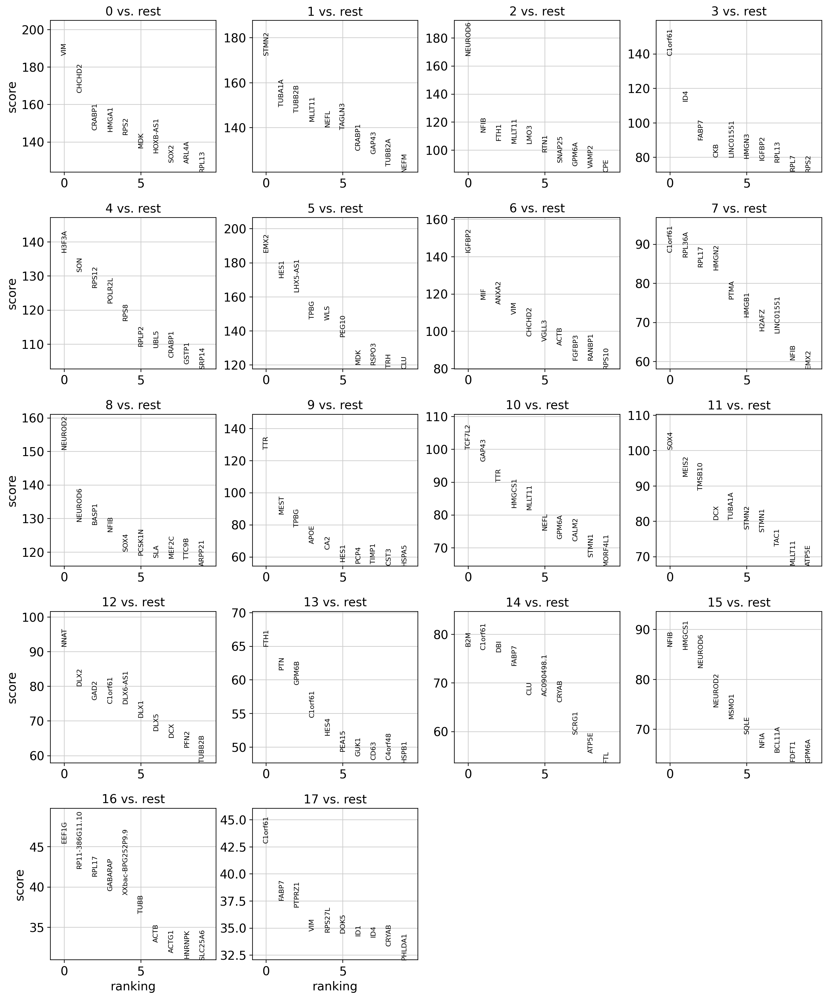

In [17]:
sc.tl.rank_genes_groups(adata_organoid, groupby='leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata_organoid, n_genes=10, sharey=False)

In [19]:
# Print top 10 marker genes per cluster as text
result = adata_organoid.uns['rank_genes_groups']
for cluster in adata_organoid.obs['leiden'].cat.categories:
    genes = [result['names'][i][int(cluster)] for i in range(10)]
    print(f'Cluster {cluster}: {", ".join(genes)}')

Cluster 0: VIM, CHCHD2, CRABP1, HMGA1, RPS2, MDK, HOXB-AS1, SOX2, ARL4A, RPL13
Cluster 1: STMN2, TUBA1A, TUBB2B, MLLT11, NEFL, TAGLN3, CRABP1, GAP43, TUBB2A, NEFM
Cluster 2: NEUROD6, NFIB, FTH1, MLLT11, LMO3, RTN1, SNAP25, GPM6A, VAMP2, CPE
Cluster 3: C1orf61, ID4, FABP7, CKB, LINC01551, HMGN3, IGFBP2, RPL13, RPL7, RPS2
Cluster 4: H3F3A, SON, RPS12, POLR2L, RPS8, RPLP2, UBL5, CRABP1, GSTP1, SRP14
Cluster 5: EMX2, HES1, LHX5-AS1, TPBG, WLS, PEG10, MDK, RSPO3, TRH, CLU
Cluster 6: IGFBP2, MIF, ANXA2, VIM, CHCHD2, VGLL3, ACTB, FGFBP3, RANBP1, RPS10
Cluster 7: C1orf61, RPL36A, RPL17, HMGN2, PTMA, HMGB1, H2AFZ, LINC01551, NFIB, EMX2
Cluster 8: NEUROD2, NEUROD6, BASP1, NFIB, SOX4, PCSK1N, SLA, MEF2C, TTC9B, ARPP21
Cluster 9: TTR, MEST, TPBG, APOE, CA2, HES1, PCP4, TIMP1, CST3, HSPA5
Cluster 10: TCF7L2, GAP43, TTR, HMGCS1, MLLT11, NEFL, GPM6A, CALM2, STMN1, MORF4L1
Cluster 11: SOX4, MEIS2, TMSB10, DCX, TUBA1A, STMN2, STMN1, TAC1, MLLT11, ATP5E
Cluster 12: NNAT, DLX2, GAD2, C1orf61, DLX6-AS1, D

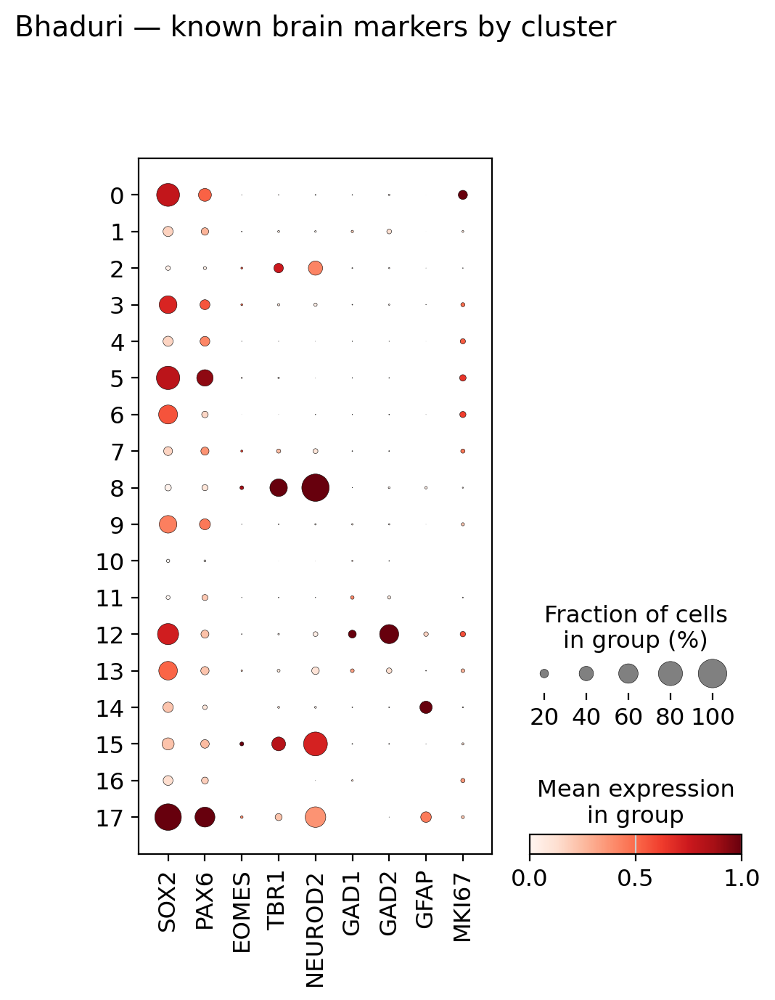

In [20]:
# Dot plot — expression of known markers across clusters
# Dot size = fraction of cells expressing; color = mean expression
if available:
    sc.pl.dotplot(adata_organoid, available, groupby='leiden', standard_scale='var',
                  title='Bhaduri — known brain markers by cluster')

---

## 9. Zhong — Inspect Metadata

Zhong's barcodes may encode gestational week (e.g. GW8, GW10, ...) — if so we can color the UMAP by developmental stage.

In [21]:
print('First 10 barcodes:')
print(adata_fetal.obs_names[:10].tolist())
print()
print('Obs columns:', list(adata_fetal.obs.columns))

First 10 barcodes:
['GW08_PFC1_sc1', 'GW08_PFC1_sc2', 'GW08_PFC1_sc3', 'GW08_PFC1_sc4', 'GW08_PFC1_sc5', 'GW08_PFC1_sc6', 'GW08_PFC1_sc7', 'GW08_PFC1_sc8', 'GW08_PFC1_sc9', 'GW08_PFC1_sc11']

Obs columns: ['n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes']


In [22]:
# Try to extract gestational week from barcode
# Typical Zhong barcodes look like: GW8_cell1, or include GW info as prefix
import re

def extract_gw(barcode):
    match = re.search(r'GW(\d+)', barcode, re.IGNORECASE)
    return f'GW{match.group(1)}' if match else 'unknown'

adata_fetal.obs['gestational_week'] = [extract_gw(b) for b in adata_fetal.obs_names]

gw_counts = adata_fetal.obs['gestational_week'].value_counts().sort_index()
print('Gestational weeks found:')
print(gw_counts)

Gestational weeks found:
gestational_week
GW08     23
GW09     88
GW10    188
GW12     86
GW13     24
GW16    767
GW19    120
GW23    314
GW26    720
Name: count, dtype: int64


## 10. Zhong — Neighbor Graph

- `n_pcs=20` — chosen from elbow plot in colab_01 (sharp elbow at ~PC20)
- `n_neighbors=15` — default, appropriate for the smaller dataset (2,330 cells)

In [23]:
sc.pp.neighbors(adata_fetal, n_neighbors=15, n_pcs=20)
print('Zhong: neighbor graph built.')

Zhong: neighbor graph built.


## 11. Zhong — UMAP

In [24]:
sc.tl.umap(adata_fetal)
print('Zhong: UMAP computed.')

Zhong: UMAP computed.


## 12. Zhong — Leiden Clustering

In [25]:
LEIDEN_RES_FETAL = 0.5  # adjust after looking at the UMAP

sc.tl.leiden(adata_fetal, resolution=LEIDEN_RES_FETAL)

n_clusters = adata_fetal.obs['leiden'].nunique()
print(f'Zhong: {n_clusters} clusters at resolution={LEIDEN_RES_FETAL}')
print(adata_fetal.obs['leiden'].value_counts().sort_index())

/tmp/ipykernel_74039/1455659057.py:3: FutureWarning: The `igraph` implementation of leiden clustering is *orders of magnitude faster*. Set the flavor argument to (and install if needed) 'igraph' to use it.
In the future, the default backend for leiden will be igraph instead of leidenalg. To achieve the future defaults please pass: `flavor='igraph'` and `n_iterations=2`. `directed` must also be `False` to work with igraph’s implementation.
  sc.tl.leiden(adata_fetal, resolution=LEIDEN_RES_FETAL)


Zhong: 11 clusters at resolution=0.5
leiden
0     601
1     303
2     273
3     267
4     254
5     193
6     143
7     131
8      76
9      73
10     16
Name: count, dtype: int64


## 13. Zhong — Visualize UMAP

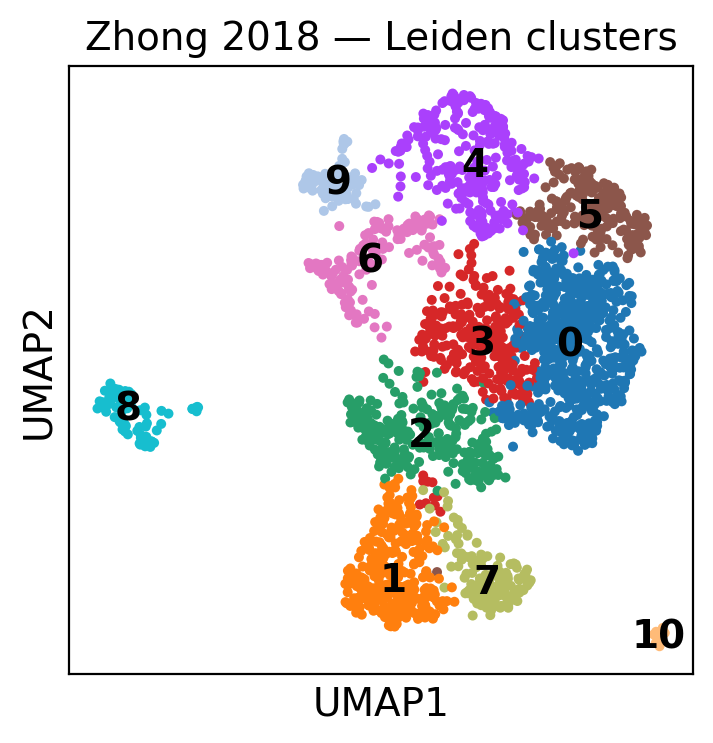

In [26]:
sc.pl.umap(adata_fetal, color='leiden', legend_loc='on data', title='Zhong 2018 — Leiden clusters')

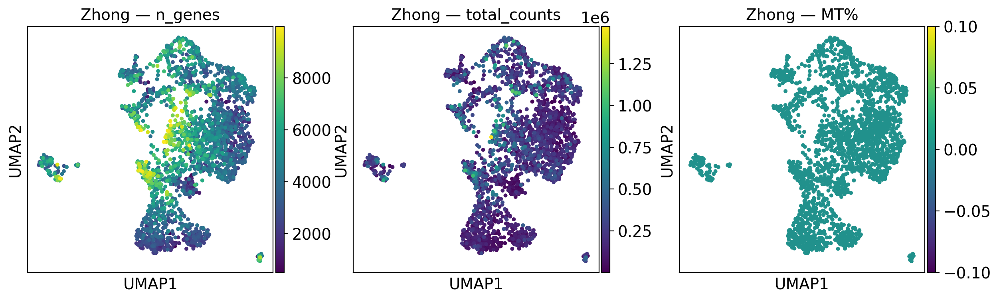

In [28]:
# Color by QC metrics — check if any cluster is driven by technical noise
# High MT% cluster = stress/dying cells; high n_genes cluster = remaining doublets
sc.pl.umap(
    adata_fetal,
    color=['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
    title=['Zhong — n_genes', 'Zhong — total_counts', 'Zhong — MT%']
)

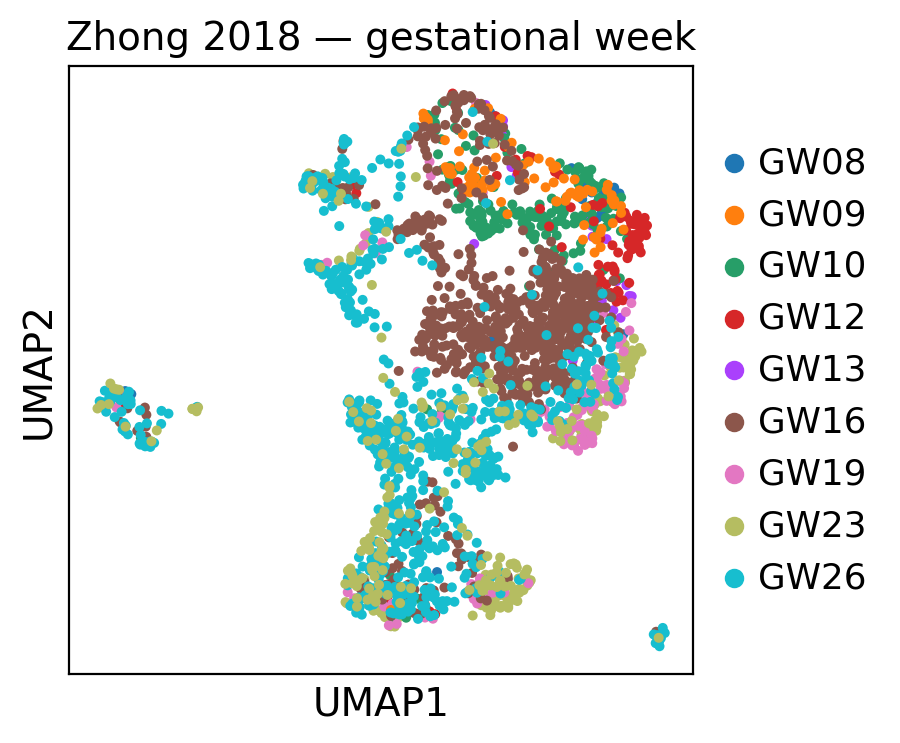

In [29]:
# Color by gestational week — should see temporal ordering in the UMAP if the
# transcriptional program captures developmental progression
if adata_fetal.obs['gestational_week'].nunique() > 1:
    sc.pl.umap(adata_fetal, color='gestational_week', title='Zhong 2018 — gestational week')
else:
    print('Could not extract gestational week — check barcodes.')

Available markers: ['SOX2', 'PAX6', 'EOMES', 'TBR1', 'NEUROD2', 'GAD1', 'GAD2', 'GFAP', 'MKI67']
Missing from dataset: []


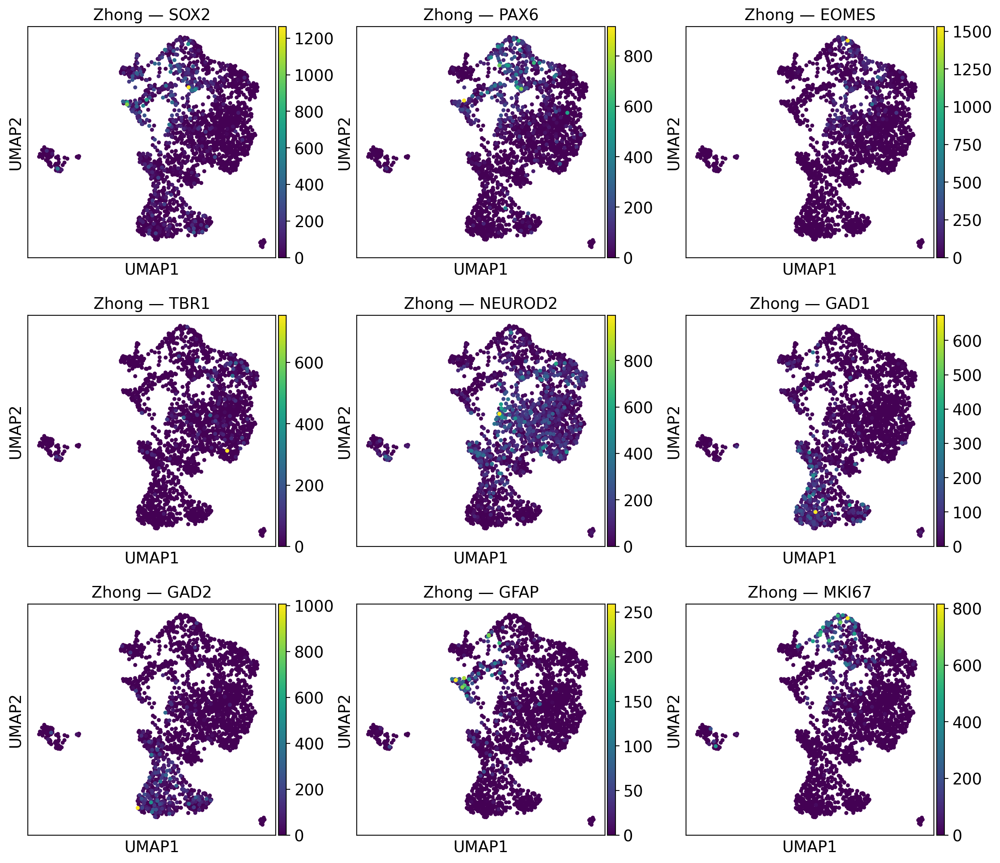

In [30]:
# Known brain cell type markers — where do they land on the UMAP?
# This gives a first pass at cell type identity before formal annotation
available_fetal = [g for g in brain_markers if g in adata_fetal.var_names]
missing_fetal   = [g for g in brain_markers if g not in adata_fetal.var_names]
print(f'Available markers: {available_fetal}')
print(f'Missing from dataset: {missing_fetal}')

if available_fetal:
    sc.pl.umap(adata_fetal, color=available_fetal, ncols=3, title=[f'Zhong — {g}' for g in available_fetal])

## 14. Zhong — Marker Genes

/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:480: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:480: RuntimeWarning: invalid value encountered in divide
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:483: RuntimeWarning: divide by zero encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:480: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: ov

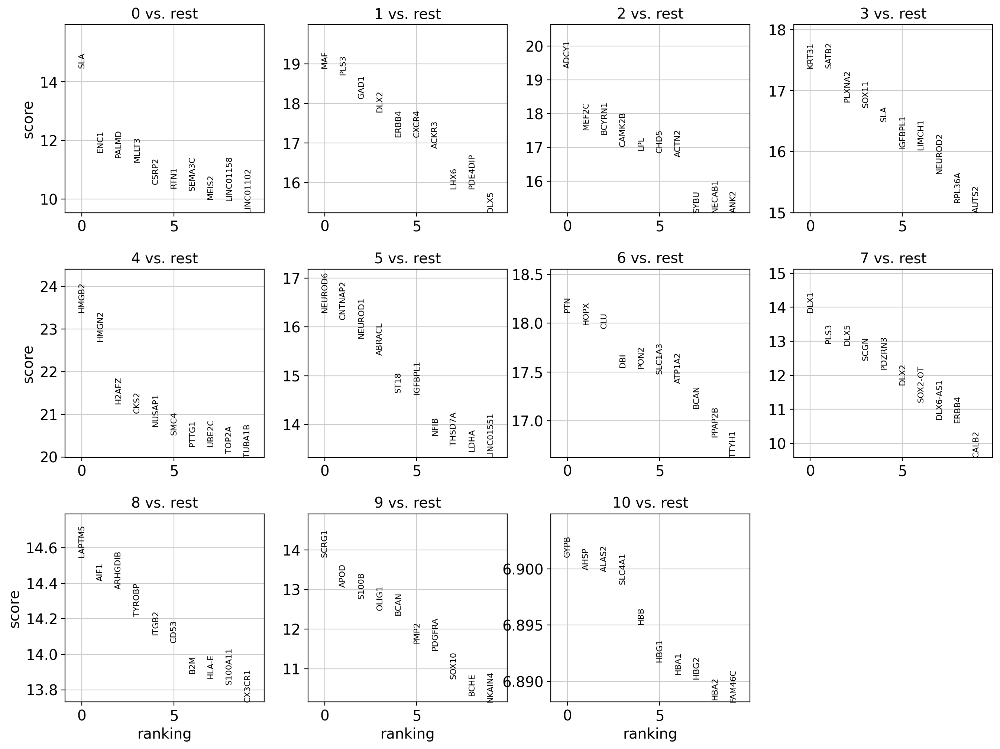

In [31]:
sc.tl.rank_genes_groups(adata_fetal, groupby='leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata_fetal, n_genes=10, sharey=False)

In [34]:
# Print top 10 marker genes per cluster as text
result = adata_fetal.uns['rank_genes_groups']
for cluster in adata_fetal.obs['leiden'].cat.categories:
      genes = [result['names'][i][int(cluster)] for i in range(10)]
      print(f'Cluster {cluster}: {", ".join(genes)}')

Cluster 0: SLA, ENC1, PALMD, MLLT3, CSRP2, RTN1, SEMA3C, MEIS2, LINC01158, LINC01102
Cluster 1: MAF, PLS3, GAD1, DLX2, ERBB4, CXCR4, ACKR3, LHX6, PDE4DIP, DLX5
Cluster 2: ADCY1, MEF2C, BCYRN1, CAMK2B, LPL, CHD5, ACTN2, SYBU, NECAB1, ANK2
Cluster 3: KRT31, SATB2, PLXNA2, SOX11, SLA, IGFBPL1, LIMCH1, NEUROD2, RPL36A, AUTS2
Cluster 4: HMGB2, HMGN2, H2AFZ, CKS2, NUSAP1, SMC4, PTTG1, UBE2C, TOP2A, TUBA1B
Cluster 5: NEUROD6, CNTNAP2, NEUROD1, ABRACL, ST18, IGFBPL1, NFIB, THSD7A, LDHA, LINC01551
Cluster 6: PTN, HOPX, CLU, DBI, PON2, SLC1A3, ATP1A2, BCAN, PPAP2B, TTYH1
Cluster 7: DLX1, PLS3, DLX5, SCGN, PDZRN3, DLX2, SOX2-OT, DLX6-AS1, ERBB4, CALB2
Cluster 8: LAPTM5, AIF1, ARHGDIB, TYROBP, ITGB2, CD53, B2M, HLA-E, S100A11, CX3CR1
Cluster 9: SCRG1, APOD, S100B, OLIG1, BCAN, PMP2, PDGFRA, SOX10, BCHE, NKAIN4
Cluster 10: GYPB, AHSP, ALAS2, SLC4A1, HBB, HBG1, HBA1, HBG2, HBA2, FAM46C


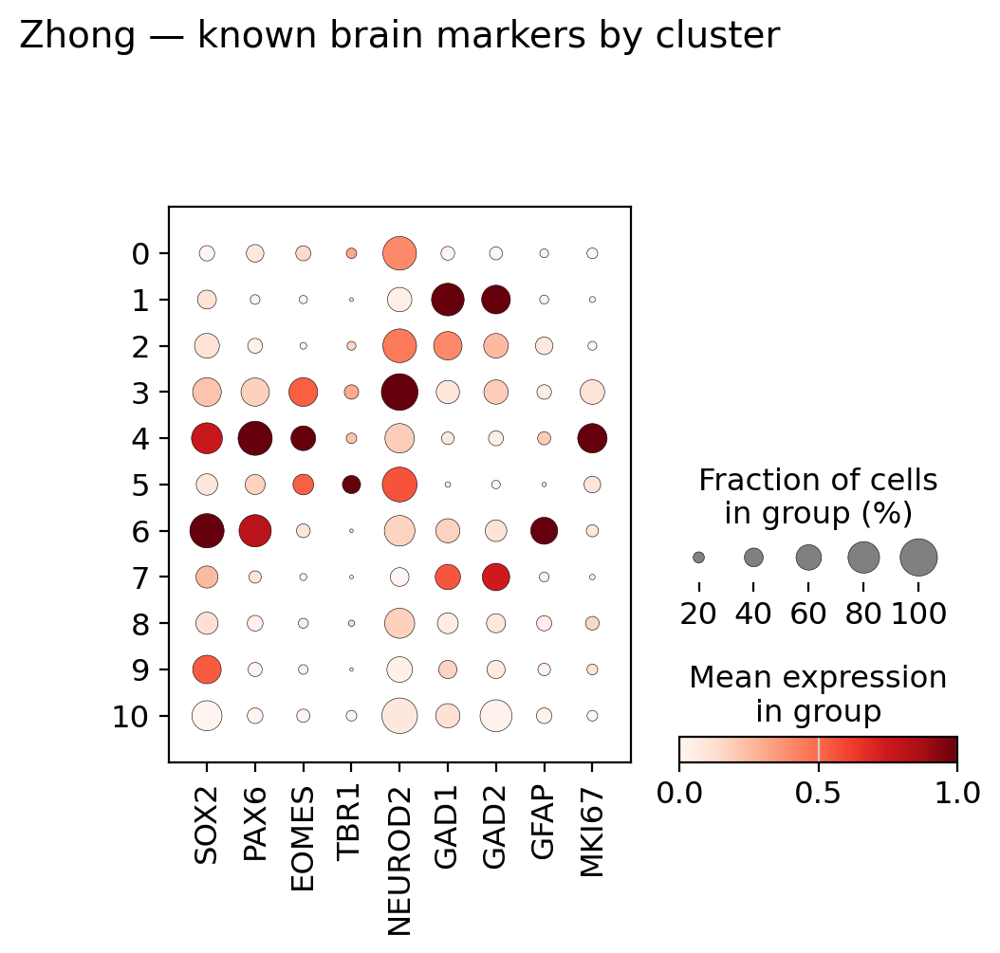

In [35]:
if available_fetal:
    sc.pl.dotplot(adata_fetal, available_fetal, groupby='leiden', standard_scale='var',
                  title='Zhong — known brain markers by cluster')

## 15. Save Clustered Objects

In [36]:
adata_organoid.write_h5ad(PATHS['bhaduri_clustered'])
adata_fetal.write_h5ad(PATHS['zhong_clustered'])

for k in ['bhaduri_clustered', 'zhong_clustered']:
    size_mb = os.path.getsize(PATHS[k]) / 1e6
    print(f'Saved: {PATHS[k]} ({size_mb:.1f} MB)')

Saved: /content/drive/MyDrive/brain-organoid-trajectories/data/processed/bhaduri_2020/bhaduri_2020_clustered.h5ad (5286.2 MB)
Saved: /content/drive/MyDrive/brain-organoid-trajectories/data/processed/zhong_2018/zhong_2018_clustered.h5ad (590.9 MB)


## Done

Both datasets have been clustered:
- Neighbor graph built (30 PCs / Bhaduri, 20 PCs / Zhong)
- UMAP computed
- Leiden clusters assigned (resolution=0.5 — adjust if needed)
- Marker genes ranked per cluster
- UMAP colored by clusters, QC metrics, and known brain markers

Saved to Drive:
- `data/processed/bhaduri_2020/bhaduri_2020_clustered.h5ad`
- `data/processed/zhong_2018/zhong_2018_clustered.h5ad`

**Next steps:**
1. Inspect the UMAPs and adjust Leiden resolution if the cluster granularity is off
2. Annotate clusters with cell type labels using the marker genes
3. `colab_03_integration.ipynb` — Harmony or scVI to align both datasets